# Monte Carlo Methods

In this notebook, you will write your own implementations of many Monte Carlo (MC) algorithms. 

While we have provided some starter code, you are welcome to erase these hints and write your code from scratch.

### Part 0: Explore BlackjackEnv

We begin by importing the necessary packages.

In [1]:
import sys
import gym
import numpy as np
from collections import defaultdict

from plot_utils import plot_blackjack_values, plot_policy

Use the code cell below to create an instance of the [Blackjack](https://github.com/openai/gym/blob/master/gym/envs/toy_text/blackjack.py) environment.

In [2]:
env = gym.make('Blackjack-v0')

Each state is a 3-tuple of:
- the player's current sum $\in \{0, 1, \ldots, 31\}$,
- the dealer's face up card $\in \{1, \ldots, 10\}$, and
- whether or not the player has a usable ace (`no` $=0$, `yes` $=1$).

The agent has two potential actions:

```
    STICK = 0
    HIT = 1
```
Verify this by running the code cell below.

In [3]:
print(env.observation_space)
print(env.action_space)

Tuple(Discrete(32), Discrete(11), Discrete(2))
Discrete(2)


Execute the code cell below to play Blackjack with a random policy.  

(_The code currently plays Blackjack three times - feel free to change this number, or to run the cell multiple times.  The cell is designed for you to get some experience with the output that is returned as the agent interacts with the environment._)

In [6]:
for i_episode in range(3):
    state = env.reset()
    while True:
        print(state)
        action = env.action_space.sample()
        state, reward, done, info = env.step(action)
        if done:
            print('End game! Reward: ', reward)
            print('You won :)\n') if reward > 0 else print('You lost :(\n')
            break

(16, 9, False)
End game! Reward:  -1.0
You lost :(

(19, 9, False)
End game! Reward:  1.0
You won :)

(19, 4, True)
End game! Reward:  1.0
You won :)



### Part 1: MC Prediction

In this section, you will write your own implementation of MC prediction (for estimating the action-value function).  

We will begin by investigating a policy where the player _almost_ always sticks if the sum of her cards exceeds 18.  In particular, she selects action `STICK` with 80% probability if the sum is greater than 18; and, if the sum is 18 or below, she selects action `HIT` with 80% probability.  The function `generate_episode_from_limit_stochastic` samples an episode using this policy. 

The function accepts as **input**:
- `bj_env`: This is an instance of OpenAI Gym's Blackjack environment.

It returns as **output**:
- `episode`: This is a list of (state, action, reward) tuples (of tuples) and corresponds to $(S_0, A_0, R_1, \ldots, S_{T-1}, A_{T-1}, R_{T})$, where $T$ is the final time step.  In particular, `episode[i]` returns $(S_i, A_i, R_{i+1})$, and `episode[i][0]`, `episode[i][1]`, and `episode[i][2]` return $S_i$, $A_i$, and $R_{i+1}$, respectively.

In [8]:
def generate_episode_from_limit_stochastic(bj_env):
    episode = []
    state = bj_env.reset()
    while True:
        probs = [0.8, 0.2] if state[0] > 18 else [0.2, 0.8]
        action = np.random.choice(np.arange(2), p=probs)
        next_state, reward, done, info = bj_env.step(action)
        episode.append((state, action, reward))
        state = next_state
        if done:
            break
    return episode

Execute the code cell below to play Blackjack with the policy. 

(*The code currently plays Blackjack three times - feel free to change this number, or to run the cell multiple times.  The cell is designed for you to gain some familiarity with the output of the `generate_episode_from_limit_stochastic` function.*)

In [10]:
for i in range(3):
    print(generate_episode_from_limit_stochastic(env))

[((12, 10, False), 0, -1.0)]
[((21, 10, True), 0, 0.0)]
[((10, 8, False), 1, 0.0), ((19, 8, False), 0, 1.0)]


Now, you are ready to write your own implementation of MC prediction.  Feel free to implement either first-visit or every-visit MC prediction; in the case of the Blackjack environment, the techniques are equivalent.

Your algorithm has three arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `generate_episode`: This is a function that returns an episode of interaction.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.

In [11]:
def mc_prediction_q(env, num_episodes, generate_episode, gamma=1.0):
    # initialize empty dictionaries of arrays
    returns_sum = defaultdict(lambda: np.zeros(env.action_space.n))
    N = defaultdict(lambda: np.zeros(env.action_space.n))
    Q = defaultdict(lambda: np.zeros(env.action_space.n))
    # loop over episodes
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 1000 == 0:
            print("\rEpisode {}/{}.".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
            # generate episode
        episode = generate_episode(env)
        # obtain the states, actions, and rewards
        states, actions, rewards = zip(*episode)
        # prepare for discounting
        discounts = np.array([gamma**i for i in range(len(rewards)+1)])
        # update the sum of the returns, number of visits, and action-value
        # function estimates for each state-action pair in the episode
        for i, state in enumerate(states):
            print(i)
            returns_sum[state][actions[i]] += sum(rewards[i:]*discounts[:-(1+i)])
            N[state][actions[i]] += 1.0
            Q[state][actions[i]] = returns_sum[state][actions[i]] / N[state][actions[i]]    
    return Q

Use the cell below to obtain the action-value function estimate $Q$.  We have also plotted the corresponding state-value function.

To check the accuracy of your implementation, compare the plot below to the corresponding plot in the solutions notebook **Monte_Carlo_Solution.ipynb**.

0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
1
2
3
0
1
2
0
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
2
0
1
2
0
0
1
2
0
1
2
0
1
0
0
0
0
0
1
2
3
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
2
3
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
3
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
2
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
1
2
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
2
0
1
2
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
2
3
0
1
0
0
0
1
2
0
1
0
0
0
0
0
1
0
1
2
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1


0
1
0
0
1
2
0
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
1
2
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
3
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
2
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
0
1
2
3
4
0
1
2
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
2
3
4
0
1
0
1
2
0
1
0
0
Episode 3000/500000.0
0
0
1
2
0
0
1
2
3
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
3
4
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
2
0
0
1
2
0
1
2
0
0
1
2
3
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
1
2


0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
3
0
1
2
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
2
3
0
0
0
0
0
0
0
0
1
2
3
0
1
2
0
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
2
3
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
2
3
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
1
2
3
0
0
0
1
2
3
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
2
0
0
0
0
1
2
3
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
1
2
0
0
1
0
0
1
2
0
1
2
0
0
0
0
0
0
0
1


Episode 8000/500000.0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
3
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
2
3
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
1
2
0
0
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
2
3
0
1
0
1
2
0
1
0
1
0
1
0
0
1
2
3
0
0
1
2
0
1
0
1
2
0
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
2
3
0
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
1
2
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
0


0
0
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
2
3
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
3
0
1
2
3
0
1
0
0
0
0
1
2
0
1
2
3
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
2
3
0
0
1
0
1
2
0
1
0
0
1
2
0
0
0
1
0
1
2
3
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
2
0
1
2
0
1
0
1
2
3
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
2
0
1
2
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
2
0
1
2
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0


0
1
0
1
0
0
0
0
1
2
0
1
0
1
2
3
0
0
1
2
0
0
0
0
0
1
2
0
0
1
2
3
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
2
3
0
1
0
1
2
0
1
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
3
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
2
3
4
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
1
2
0
1
0
1
2
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
2
3
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
0
0
0
0
1
2
3
4
0
0
1
2
0
0
0
0
1
2
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
2
3
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
2
3
4
0
1
0
1
0
0
1
0
1
0
0
0
1
2
3
0
0
0
1
2
0
0
1
0
0
1
2


1
2
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
2
0
0
0
0
1
2
0
0
0
0
0
1
2
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
3
0
0
0
0
1
2
3
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
3
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
2
3
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
2
3
0
0
1
2
0
0
0
0
1
0
1
2
0
0
1
2
0
1
0
0
0


Episode 19000/500000.0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
1
2
0
0
1
2
0
1
2
3
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
1
2
3
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
1
2
3
0
1
0
1
0
0
1
2
0
0
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
2
3
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
0
1
2
0
1
0
1
0
0
1
2
0
0
0
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
2
3
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
0
1

1
0
0
0
1
0
1
2
0
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0
1
2
0
0
1
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
2
3
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
2
3
4
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
2
3
0
0
0
0
1
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
1
2
3
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
1
2
0
0
1
2
0
1
2
0
1
0
1
0
1
0
1
2
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
1
2
3
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
1
0
0
1
0
1
0
1
2
3
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
3
4
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
2
3
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
3
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2


0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
1
2
3
4
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
2
3
0
1
0
0
1
0
1
2
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
1
2
0
1
2
0
1
2
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
2
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
2
3
0


2
0
0
0
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
2
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
2
3
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
2
3
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
0
1
2
3
4
0
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
1
2
3
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0


Episode 30000/500000.0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
2
0
1
2
3
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
3
0
0
1
0
0
0
0
0
1
2
3
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
1
2
3
0
0
1
0
1
0
1
2
3
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
2
3
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0

0
0
1
0
0
1
2
3
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
1
2
0
1
0
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
2
3
0
0
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
2
3
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
2
0
1
2
0
1
2
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
2
3
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
2
3
0
0
0
1
0
1
0
1
2
0
0
0
1
2
3
0
1
0
0
0
0
0
0
1
2
3
0
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
1
0
0
1
2
3
0
1
0
0
1
0
1
0
1
2
0
0
0
1
2
3
0
1
2
0
1
0
0
1
2
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
2
3
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
Episode 33000/500000.0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
2
0
1
2
0
0
1

1
0
0
1
2
0
0
0
1
2
0
1
2
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
1
2
3
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
1
2
0
0
1
2
0
1
2
0
0
0
0
0
1
0
1
2
3
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
1
2
0
1
2
3
0
0
0
1
2
3
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
1
2
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
2
0
0
0
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
0
1
2
3
0
0
1
0
1
2
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
0
1
0
0
0
1
2
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0


0
0
0
0
1
2
0
1
0
0
1
2
3
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
2
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
1
2
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
1
2
0
0
1
2
3
4
0
1
2
0
1
0
1
0
1
0
1
2
0
1
2
3


Episode 41000/500000.0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
1
2
3
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
2
3
0
0
1
0
1
2
3
4
0
0
1
0
0
1
0
0
1
2
3
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
2
0
1
2
0
1
0
0
0
0
0
1
2
0
0
0
1
2
3
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
3
4
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
0
1
2
0
1
2
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
1
2
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
0
0

0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
0
0
0
0
1
2
3
0
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
2
0
1
0
0
1
2
0
1
0
1
0
1
0
1
2
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
2
3
4
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
Episode 44000/500000.0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
0
1
2
3
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1

0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
3
0
1
0
1
2
3
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
3
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
2
3
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
1
0
1
2
3
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
2
0
1
0
0
0
1
0
0
0
1
0
0
1
2
3
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
0
1
2
3
0
1
0
0
1
2
0
0
1
2
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
1
0
1
2
3
0
0
1
0


0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
1
2
0
1
2
0
1
2
0
0
1
2
3
0
1
0
1
0
0
1
0
0
0
0
1
2
3
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
2
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
1
2
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
1
2
3
0
0
0
0
1
0
1
0
0
0
0
1
2
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
1
2
3
0
0
1
0
0
0
1
0
0
0
1
2
0
1
2
0
0
1
2
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
1
2
0
1
0
0
1
2
3
0
1
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
2
0
1
0
0
0
0
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
2
3
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1


Episode 52000/500000.0
1
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
1
2
3
0
1
0
1
0
1
2
0
1
0
1
0
1
2
3
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
1
2
3
0
1
2
3
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
1
2
3
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
2
0
0
1
2
3
0
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
1
0
1
2
3
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
3
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
2
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
2
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
2
0
1
2
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
1
0

1
0
0
1
2
0
1
2
0
0
0
0
0
1
2
3
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
1
2
0
0
1
0
0
1
0
1
2
0
1
2
3
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
2
3
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
2
0
0
0
1
2
0
1
0
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
1
0
1
0
1
2
3
0
0
0
0
1
2
3
0
0
1
0
1
2
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
Episode 55000/500000.0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
2
3
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0

1
2
0
1
2
3
0
1
2
3
0
0
0
0
1
2
0
0
1
0
1
0
1
2
0
1
2
3
0
0
1
0
1
0
0
0
0
0
1
2
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
1
2
0
1
0
1
2
0
1
2
3
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
0
1
2
3
0
1
0
1
2
0
1
2
0
1
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
2
3
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
0
1
0
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
2
0
0
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0


0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
0
1
2
3
0
1
2
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
1
2
3
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
2
0
1
2
0
1
0
0
1
2
0
1
0
0
1
2
3
0
1
2
0
1
0
1
2
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
1
2
0
0
0
0
1
2
3
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
2
3
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
1
2
3
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
2
0
1
0
0
0
1
2
0
0
1
2
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0


1
0
0
1
2
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
0
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
2
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
1
2
0
0
1
2
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
3
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
2
0
0
1
2
3
4
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
0


Episode 66000/500000.0
1
2
3
4
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
1
2
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
1
2
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
2
3
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
2
3
0
1
0
1
2
0
1
2
3
4
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
1
0
1
2
3
0
0
0
1
2
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
2
3
4
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
2
3
0
0
1
2
0
0
1
0
1
0
0
1
0

0
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
2
3
0
0
1
0
1
2
0
1
0
0
0
1
2
3
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
1
2
3
4
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
2
3
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
3
0
0
0
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
1
2
0
0
0


0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
2
3
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
2
0
0
0
1
2
0
0
0
1
2
3
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
1
2
3
0
0
0
0
0
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
2
3
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
3
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
0
0
1
0
1
0
0
1
2
3
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1


Episode 74000/500000.0
0
1
2
3
0
0
0
0
0
1
2
0
0
1
0
1
0
1
2
3
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
3
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
1
2
3
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
0
0
1
0
0
0
0
1
2
3
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
0
1
2
3
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
0
1
2
3
0
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
3
4
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
0
0
0
1
2
3
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
1

0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
2
3
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
3
0
0
1
0
1
0
1
2
0
1
0
0
0
1
2
3
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
2
3
0
0
0
0
0
0
1
0
1
0
1
0
1
2
3
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
1
0
1
2
3
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
1
2
3
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
1
0
0
1
2
3
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
1
2
0
1
2
3
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
2
3
0
1
2
0
1
0
0
0
1
0
1
0
1


0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
1
0
0
1
2
3
0
0
1
0
1
0
1
0
0
1
2
3
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
1
2
0
1
0
0
0
0
1
2
3
0
0
1
0
1
0
0
1
2
0
1
2
0
1
2
0
1
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
3
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
0
0
1
2
0
0
0
1
0
1
2
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
2
3
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
2
3
0
0
1
2
3
0
0
0
1
0
1
2
3
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
2
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
2
3
0
1
0
1
2
0
0
0
0
1
0
0
1
2
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
1
0


Episode 82000/500000.0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
1
2
3
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
0
1
2
3
0
0
1
2
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
3
0
1
0
1
2
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
2
3
0
1
0
0
1
2
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
2
3
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1

0
1
2
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
2
3
0
1
2
0
1
0
0
0
1
2
3
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
2
3
0
1
2
3
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
0
1
2
3
0
1
2
3
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
1
2
3
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
2
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
3
0
0
1
2
0
0
1
0
0
1
0


0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
2
3
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
2
3
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
1
2
3
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
2
3
0
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
2
3
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
0


Episode 90000/500000.0
1
0
0
0
1
2
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
1
2
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
0
1
2
0
1
0
1
2
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
2
3
4
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
2
3
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
2
0
1
2
0
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
1
2
3
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
2
3
0
1
2
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0

0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
0
0
0
1
2
0
0
1
2
0
1
0
1
2
3
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
1
2
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
0
0
0
0
0
1
2
3
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
Episode 93000/500000.0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
2
3
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0

0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
2
3
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
3
0
0
0
0
1
0
1
0
0
0
1
2
3
0
0
1
2
0
0
0
0
1
0
1
0
0
1
2
3
0
0
0
1
2
0
1
2
3
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
0
1
2
0
0
0
1
2
0
1
0
1
2
3
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
3
0
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
1
2
3
0
1
0
0
0
0
0
0
1
0
1
0
0
1
2
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
0
1
2
3
0
1
0
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
0
1
2
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
3
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0


2
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
2
0
0
1
2
0
0
1
2
3
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
2
0
1
0
1
2
0
1
0
1
0
0
1
2
0
1
2
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
0
0
1
2
0
1
2
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1
2
0
1
0
1
2
3
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
2
3
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
2
3
4
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
1
2
3
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
3
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0


Episode 101000/500000.0
0
0
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
2
3
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
2
3
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
0
1
2
3
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
1
2
0
1
2
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
1
2
0
0
1
0
1
0
1
0
1
2
3
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0


1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
2
Episode 104000/500000.0
1
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
2
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
1
2
3
0
1
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1


0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
0
1
2
0
0
1
2
0
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
2
3
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
2
3
0
1
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
2
3
0
0
0
1
0
0
0
1
0
1
0
0
1
2
3
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
2
3
0
1
0
1
0
0
1
0
0
1
0
1
2
3
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
2
3
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1


0
1
0
1
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
3
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
3
4
0
0
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
3
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
2
3
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
2
0
1
2
0
1
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
1
2
0
1
0
0
1
0
0
0
1


0
1
2
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
2
3
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
1
2
3
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
2
3
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
3
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
2
3
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
3
0
1
0
1
0
0
1
0
1
0
0
1
2
3
0
0
0
0
0
1
2
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
2
3
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
1
2
3
0
1
2
0
0
0
0
1
2
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0


Episode 115000/500000.0
1
2
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
0
1
2
3
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
2
3
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
3
4
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
0
1
2
3
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
3
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
2
0
0
1
2
3
0
0
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0


0
1
0
1
0
1
0
0
1
0
1
0
1
2
3
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
2
3
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
1
2
3
4
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
2
0
1
2
0
0
0
1
0
1
2
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
2
3
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
0
1
2
3
0
0
1
2
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
2
0
1
0
1
2
0
1
0
0
1
2
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
0
1
2
3
0
1
0
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
0
Episode 118000/500000.0
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
2
3
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
1


0
1
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
2
0
1
2
0
0
0
0
1
2
0
0
1
2
3
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
1
2
3
4
0
1
2
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
2
3
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
2
3
0
0
1
2
3
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
2
3
4
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
0
1
2
3
4
0
1
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0


1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
2
0
1
0
1
2
0
0
1
2
3
0
0
0
1
0
1
0
0
0
1
2
0
1
0
1
2
3
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
2
3
0
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
2
3
4
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
2
3
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
1
2
3
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
2
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
0
0


Episode 126000/500000.0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
1
2
3
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
2
3
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
2
0
0
0
0
0
0
1
2
3
0
0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
1
2
3
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
3
0
0
0
1
0
0
0
0
1
2
3
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
2
3
4
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
1
2
3
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
2
3
0
1
2
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
2


1
0
1
2
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
1
2
3
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
2
0
1
2
3
0
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
2
0
1
0
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
2
0
0
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
1
0
0
1
2
3
0
0
1
0
0
0
1
0
0
0
0
0
1
2
0
0
1
2
3
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
3
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
0
1
2
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
0
0
1
2
3
0
1
2
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
2
3
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
2
3
4
0
0
0
1
0
0
1
2
0
1
0
1
Episode 129000/500000.0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1


0
0
1
0
0
0
1
2
0
1
2
0
1
0
1
0
1
0
1
0
1
2
3
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
0
1
2
3
0
1
0
1
2
0
0
1
0
0
1
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
1
2
3
4
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
2
3
4
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
1
2
3
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
Episode 132000/500000.0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
0
1
2
3
0
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2


0
0
0
1
0
0
1
2
0
1
2
0
1
2
3
0
0
1
0
0
0
0
0
1
0
1
0
0
1
2
3
0
1
0
0
1
0
1
2
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
1
2
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
2
3
0
0
1
2
0
0
1
2
0
1
0
0
1
0
0
0
1
2
0
0
1
0
1
0
0
0
1
2
3
4
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
2
3
4
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
2
0
0
1
0
0
1
2
3
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
Episode 135000/500000.0
0
1
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
1
2
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
2
3
0
0
0
1
2
0
0
1
0
0
1


0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
2
0
1
2
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
0
0
1
2
3
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
2
3
0
0
0
1
0
0
1
2
0
1
2
0
1
0
0
1
0
0
1
2
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
1
2
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
1
2
3
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0


0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
2
3
0
0
1
2
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
1
2
3
0
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
2
0
1
2
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
2
3
0
0
1
2
0
0
1
2
0
1
2
0
0
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0


1
2
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
1
2
0
0
1
2
3
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
2
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
0
1
2
0
0
1
2
0
1
2
0
1
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
2
0
1
2
0
0
0
0
0
0
0
1
2
0
1
2
3
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
1
2
3
0
1
2
0
0
1
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
1
2
3
0


Episode 146000/500000.0
1
2
3
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
2
3
0
0
1
2
0
1
0
1
2
3
4
0
0
1
0
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
3
0
1
0
1
0
0
0
1
0
0
0
1
0
1
2
3
4
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
2
0
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
2
3
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
1
2
3
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
2
3
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
1
2
3
4
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
2
3
0
0
0
0
0
1
0
1
2
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
1
0


0
1
2
3
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
2
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
1
2
3
0
1
0
0
0
1
0
0
1
0
1
0
1
2
3
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
1
2
0
1
2
3
0
1
0
1
0
0
1
2
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
2
3
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
2
3
0
1
0
0
0
1
0
1
2
0
1
2
0
1
0
1
2
3
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
2
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
1


1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
1
2
3
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
3
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
2
3
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
2
3
4
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
0
0
0
1
2
0
1
2
3
0
0
0
1
0
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
2
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
2
3
0
1
2
3
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
3
0
0
0
1
0
1
2
3
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
2
3
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
2
3
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
2
0
1
0
1
0
1
0
1
2
0
0


Episode 154000/500000.0
1
2
0
0
1
2
3
0
0
1
2
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
0
1
2
3
4
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
0
1
2
3
4
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
3
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
2
3
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
2
3
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
1
2
3
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
0


0
1
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
0
1
2
0
1
0
0
0
0
1
2
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
2
3
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
2
0
1
0
0
1
2
3
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
1
2
3
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
2
3
0
0
1
2
0
0
1
0
1
2
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
1
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
1
2
0
0
0
1
0
0
1
Episode 157000/500000.0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
2
3
0
0
1
2
0
1
2
0


0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
2
0
0
1
2
0
0
0
1
2
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
1
2
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
1
2
3
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
1
0
1
0
0
1
2
0
0
1
2
0
0
1
0
0
1
2
0
1
0
1
2
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
1
2
0
0
1
0
0
1
2
3
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
1
2
0
1
2
3
4
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0


1
0
1
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
1
2
3
0
0
0
1
2
0
1
0
0
0
0
0
1
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
2
3
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
1
2
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
2
3
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
0
0
1
2
3
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
2
3
0
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1


Episode 165000/500000.0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
2
3
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
2
3
0
1
0
1
2
3
0
1
2
0
1
2
0
1
2
3
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
2
3
0
1
0
0
1
2
0
0
0
0
1
2
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
0
1
2
3
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
0
1
2
3
4
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0


1
2
0
0
0
1
2
3
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
2
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
0
1
2
0
0
0
1
2
0
1
0
0
1
0
0
1
2
0
1
2
3
0
1
0
1
2
3
0
1
2
0
1
0
0
0
1
2
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
2
3
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
2
3
4
0
0
0
0
1
0
0
1
2
3
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
2
3
0
0
1
0
1
0
1
2
0
0
0
1
2
3
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
1
2
3
0
0
1
0
0
1
2
0
1
0
0
0
1
Episode 168000/500000.0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
2
3
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
2
0
1
2
0
0


0
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
0
0
0
1
2
0
1
0
1
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
1
2
3
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
1
2
3
0
1
0
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
2
0
1
0
1
0
0
1
2
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
2
3
0
1
0
0
0


0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
2
3
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
2
3
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
0
1
0
0
1
2
3
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
3
0
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
1
0
1
2
3
0
0
1
2
0
1
2
0
0
1
2
0
0
0
1
2
0
0
1
2
3
0
0
0
0
0
0
1
0
1
2
0
0
1
0
1
2
3
0
0
0
0
1
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
0
0
0
0
1
0
1
2
Episode 174000/500000.0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
3
4
5
0
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
0
0
1
2
3
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0


1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
2
3
0
1
0
0
0
0
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0


2
3
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
2
0
0
0
1
2
3
0
1
0
1
0
0
1
2
0
0
1
2
0
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
2
0
1
2
3
0
1
2
3
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
2
0
0
0
0
0
1
2
3
0
0
0
0
1
0
0
1
0
1
0
1
2
3
0
1
0
1
0
0
0


0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
2
3
0
1
2
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
1
2
3
0
0
1
0
0
1
2
0
1
0
0
1
2
3
0
1
0
1
2
0
0
0
1
2
3
0
1
0
1
0
1
0
1
0
0
1
2
3
0
0
0
0
1
2
0
1
2
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
1
2
3
0
1
2
3
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
1
2
0
1
0
1
2
0
1
2
3
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
1
2


0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
2
3
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
1
2
3
0
0
1
0
1
2
0
1
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
1
2
3
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
1
2
0
1
2
0
1
2
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
1
2
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
2
3
0
1
2
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0


0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
1
2
3
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
2
3
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
2
3
0
1
2
0
0
0
1
0
0
0
1
0
0
1
2
3
0
0
0
1
2
3
0
0
0
1
0
0
1
0
1
2
0
1
2
3
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
1
2
0
0
0
1
2
3
0
1
2
0
1
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
1
2
0
0
1
0
1
2
3
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
2
0


Episode 191000/500000.0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
2
0
0
1
2
3
0
0
1
0
1
2
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
0
1
2
0
1
0
0
1
2
3
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
0
0
0
1
2
3
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
0
1


0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
2
3
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
2
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
0
0
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
0
0
1
0
1
0
1
2
3
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
1
2
3
0
0
0
0
0
0
1
2
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0


0
1
0
1
2
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
2
3
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
3
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
1
2
0
1
2
3
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
0
0
0
1
2
3
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
0
1
2
0
1
2
0
0
1
2
3
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
2
0
1
2
0
1
2
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
3
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
2
3
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0


0
0
1
0
0
1
0
1
0
0
1
2
0
1
2
3
0
0
0
0
1
2
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
1
2
3
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
2
3
0
0
0
1
0
0
1
0
1
0
1
2
3
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
2
3
0
0
0
1
0
1
2
3
0
1
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
2
3
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
2
0
0
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
1
0
1


Episode 202000/500000.0
0
0
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
2
3
4
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
1
2
0
1
2
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
3
0
1
2
0
1
2
0
1
2
0
0
1
2
0
1
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
2
3
4
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0


0
0
1
2
3
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
1
2
0
1
0
1
0
0
1
2
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
2
3
0
0
1
2
3
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
0
0
0
0
1
2
3
0
0
0
0
0
1
0
0
0
1
0
1
2
3
4
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
2
0
1
2
0
1
2
3
0
0
0
0
1
2
3
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
1
2
0
1
0
0
0
0
0
0
0


0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
3
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
1
0
0
1
2
3
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
1
2
3
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
2
3
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
1
2
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
2
3
0
0
1
2
0
0
0
0
1
2
0
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
1
2
3
0
1
0
1
2
3
0
1
2
3
0
1
0
0
0
1
2
0
0
0
1
2
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1


0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
0
1
2
3
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
0
0
1
0
0
1
2
3
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
2
3
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
1
0
1
0
1
0
1
2
0
1
2
0
1
2
3
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
1


0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
2
3
0
0
1
0
1
2
0
1
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
2
0
1
2
0
1
2
0
1
0
1
0
0
1
0
1
2
3
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
1
0
1
2
3
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
2
3
0
0
1
0
1
2
0
0
0
1
2
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
2
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
1
0
1
0
0
1
2
3
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0


Episode 216000/500000.0
1
2
3
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
2
3
0
1
0
1
0
0
0
1
0
1
2
0
1
2
0
1
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0


1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
2
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
1
2
3
0
1
2
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
2
3
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
3
0
0
0
0
0
1
2
0
0
1
0
1
Episode 219000/500000.0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
1
2
0
1
0
1
2
0
1
2
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
2


0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
1
2
3
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
1
2
3
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
2
3
4
0
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
0
1
2
0
1
0
0
0
0
0
1
2
3
4
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1


0
1
2
0
0
0
1
2
0
1
0
1
0
0
0
0
0
1
2
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
3
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1
2
3
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
3
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
1
2
3
0
0
0
0
0
0
1
2
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
2
3
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
2
3
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
2


0
1
0
0
1
2
0
0
1
2
3
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
2
3
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
2
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
2
3
0
1
0
0
0
1
2
0
0
0
1
2
3
0
0
1
0
1
0
1
2
3
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
2
3
0
1
0
1
0
1
0
1
0
1
2
3
4
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
1
2
3
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
1
2
3
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
0


Episode 230000/500000.0
0
1
2
0
0
1
2
0
0
0
0
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
3
0
1
2
3
0
1
0
0
1
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
2
0
1
2
3
0
1
2
0
0
0
0
1
2
3
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
2
0
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
1
2
0
0
1
2
0
0
1
0
1
2
0
1
0
0


1
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
2
0
1
2
3
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
2
3
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
3
0
1
0
0
0
1
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
3
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
2
0
1
0
0
0
0
0
0
0
1
2
3
0
1
0
1
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
1
2
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
2
3
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
2
3
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
2
0
0
1
2
0
0


0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
1
2
3
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
2
0
1
2
3
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0
0
1
2
3
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
1
2
0
1
2
0
1
2
0
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
3
0
0
1
0
0
1
0
0


1
0
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
3
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
2
3
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
1
2
3
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
2
0
1
2
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
3
0
0
1
2
0
1
0
1
0
1
2
3
4
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
3
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
2
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
0
1
2
3
0
1
0
0
1
0
1
2
0
0
0
0
0
1
2
3
0
0
1
2
0
0
1
0
1
2
0
0
1
2
3
4
0
1
2
0
1
0
1
2
3
0
0
0
0
1
0
1
0


Episode 241000/500000.0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
2
3
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
1
2
0
1
2
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
3
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
2
0
0
1
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
3
4
0
1
0
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
1
2
0
1
2
0
0
0
1
0
0
1
2
0
1
2
3
0
0
0
0
0
0
0
0
0
0
1
2
3
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
2
3
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
2
0
0
0
0
0
0
1


0
1
2
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
1
2
0
1
2
3
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
0
1
2
0
0
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
2
3
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
2
3
0
0
0
1
2
0
0
0
1
2
3
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
0
1
2
0
1
0
0
1
2
3
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
2
0
1
0
1
2
0
1
2
0
0
1
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
2
3
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
2
3
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
1


1
0
1
0
1
0
1
0
0
1
2
3
4
5
0
1
2
3
4
5
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
1
2
3
0
1
2
3
0
0
1
2
0
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
2
0
1
2
0
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
1
2
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
1
2
3
4
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
0
1
2
3
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
3
4
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
1
0
1
2
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
0
1
2
0
0
0
1
0
1
2
0
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
1


Episode 249000/500000.0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
1
2
3
0
0
0
0
1
0
1
2
0
1
2
0
1
2
3
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
2
3
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
1
2
3
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
0
1
0
0
1
2
3
0
0
0
0
1
2
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
3
4
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
1
2
3
0
1
0
0
1
0
0
0
0
1
2
0
1


0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
2
3
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
2
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
2
3
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
1
2
3
4
0
1
0
1
0
0
0
0
0
1
2
3
0
0
0
0
0
1
0
0
1
2
3
0
0
0
1
0
1
0
1
2
0
1
2
0
1
0
1
2
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
2
0
0
0
0
1
2
0
1
2
0
1
2
0
0
0
0
1
2
0
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
2
3
0
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
0
0
1
0
Episode 252000/500000.0
0
0
0
0
0
1
2
3
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
2
3
0
1
2
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1


0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
2
3
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1
2
3
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
0
Episode 255000/500000.0
1
0
0
1
2
3
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
0
1
0
1
2
3
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
2
3
4
0
1
2
0
0
0
1
0
0
0
1
2
3
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
2
3
0
0
1
2
0
1
2
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1


0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
1
2
3
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
1
2
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
1
2
3
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
2
3
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
Episode 258000/500000.0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
1
2


0
1
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
1
2
3
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
3
0
1
2
3
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
2
3
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
1
0
1
0
1
2
3
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
1
2
3
4
5
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
2
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0


0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
1
0
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
2
3
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
1
2
3
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
1
0
0
1
2
3
4
5
0
1
2
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
2
3
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
1
0
0
0
1
2
3
4
0
1
0
0
1
0
0
0
1
0
1
2
3
0
1
2
3
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
0
1
0
1
2
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
0
1
0
0
0
0
1
2
3
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
2
3
0
1
2
3
0
0
1
2
0
1
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1


Episode 266000/500000.0
0
1
2
0
1
0
0
0
1
2
0
1
0
1
2
0
1
2
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
2
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
2
3
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
2
0
1
2
0
1
0
1
2
0
1
2
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
1
2
3
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
1
2
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
3
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
2
3
0
0
1
2
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
0
1


0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
1
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
3
0
1
0
1
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
2
3
0
1
2
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
2
3
0
0
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
2
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
0
0
1
0
1
Episode 269000/500000.0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
0
0
1
2
3
0
0
0
1
2
3
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
1
2
0
0
1
2
0
0
1
0
1
2
0
1
2
0
1
0
0
0
0


0
0
1
0
0
0
0
0
1
2
3
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
2
3
0
0
0
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
2
3
4
0
0
1
2
0
0
1
2
0
1
2
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
2
3
0
0
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
1
0
1
2
0
1
0
0
0
1
2
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
1
0
1
0
1
2
3
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
2
3
4
0
0
0
1
0
0
0
0
1
0
0
1
2
3
0
0
1
0
1
0
1
2
0
1
0
0
0
1
2
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
2
3
0
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
1
0
1
0
0
0


0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
1
2
0
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
2
3
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
1
2
3
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1


Episode 277000/500000.0
1
2
3
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
2
3
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
1
2
3
4
0
0
0
1
2
3
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
2
3
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
1
0
1
0
1
2
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
0
1
2
3
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
2
3
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
0


0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
2
3
4
0
1
2
0
1
0
0
0
0
0
1
0
0
0
1
2
3
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
0
1
2
0
1
0
1
2
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
2
3
4
0
0
1
0
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
2
Episode 280000/500000.0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
0
0
0
0
1
2
3
0
1
0
0
0
0
0
1
0
0
1
2
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0


1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
1
2
3
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
2
3
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
0
1
2
3
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
2
3
0
0
0
Episode 283000/500000.0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
0
0
1
2
0
0
0
1
0
1
2
3
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
3
4
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
1
2
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
0
1
0
1
2
3
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
3
0
1
0
1
0
0
0
1
0
1
2
3
0
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
1
2
3
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
1
2
3
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0


1
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
1
2
0
1
2
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
0
1
2
3
0
1
0
0
1
2
0
1
0
1
2
3
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
2
0
1
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
2
3
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
0
0
0
1
2
0
0
1
2
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
Episode 286000/500000.0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
1
0


1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
2
3
4
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
2
0
0
0
0
0
1
2
3
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
2
3
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
0
1
2
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
2
3
0
1
0
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
2
0
1
0
1
0
0
1
0
1
2
0


1
2
3
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
0
1
2
3
0
1
2
0
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
2
3
0
0
1
0
0
1
2
0
1
0
1
0
1
0
1
2
0
1
2
3
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
1
2
3
0
0
1
2
3
4
0
1
0
1
0
1
2
0
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
1
2
3
4
0
1
0
1
2
0
0
1
2
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
2
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
2
3
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0


Episode 294000/500000.0
0
0
0
1
0
1
0
1
2
0
1
2
0
0
0
1
2
0
1
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
2
3
0
1
0
1
2
0
1
0
1
2
0
0
0
0
0
0
1
0
1
2
3
0
0
1
0
1
2
0
0
1
0
1
2
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
1
2
3
0
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
1
0
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
2
3
0
1
2
3
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
1
2
3
0
0
0
0
1
2
3
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
2
3
0
0
0
1
0
1
0
1
0
1
0
0
1
2
3
0
1
0
1
2
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
0
0


0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
2
3
0
1
0
1
2
0
0
0
1
2
0
1
0
1
2
3
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
2
3
4
0
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
Episode 297000/500000.0
1
2
3
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
2
3
0
0
0
1
2
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1


0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
1
0
1
2
3
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
2
3
0
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
2
3
4
0
1
0
1
0
0
1
2
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
1
2
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
0
1
2
3
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
2
3
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0
1
2
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
2
3
0
0


0
0
0
1
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
1
2
0
1
2
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
1
2
3
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
0
1
2
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
2
3
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
1
2
3
4
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
1
2
0
0
1
2
0
1


0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
2
3
0
1
2
0
1
0
0
0
1
2
0
1
2
0
1
2
3
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
2
3
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
2
0
0
1
2
0
1
0
1
2
0
0
0
0
0
1
2
3
4
5
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
1
2
3
0
0
1
2
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
2
3
4
0
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0


Episode 308000/500000.0
0
0
1
0
0
1
2
0
0
0
1
0
1
2
0
0
0
1
2
3
0
1
0
1
2
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
2
3
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
1
2
3
0
1
0
1
2
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
2
3
0
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
2
0
1
2
0
1
2
0
0
0
1
2
0
1
0
1
0
1
2
0
1
2
3
0
1
2
3
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
2
0


0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
3
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
3
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
1
2
0
0
1
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
1
2
3
0
1
2
0
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
2
3
0
1
2
0
1
2
0
0
1
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0


0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
2
3
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
3
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
2
3
4
0
1
0
0
1
0
0
0
0
1
0
0
0
0


0
0
0
0
1
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
2
3
0
0
0
1
0
0
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
2
3
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
3
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2
3
0
0
1
0
1
2
0
1
2
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
2
3
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
0
1
2
3
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
1


Episode 319000/500000.0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
2
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
1
2
0
1
2
0
1
0
1
0
0
1
2
3
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
1
2
3
0
0
1
2
0
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
2
3
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
1
2
3
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1


1
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
1
2
3
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
1
0
0
1
2
3
0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
2
0
0
0
1
2
3
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0


1
2
0
0
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
3
0
0
0
1
0
0
0
1
2
0
0
0
0
1
0
1
0
1
2
3
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
1
2
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
0
1
2
3
4
0
0
0
1
2
3
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
1
0
1
2
3
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
0
1
2
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
1
2
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
0
0


Episode 327000/500000.0
0
0
0
0
1
2
0
1
2
3
0
1
0
1
2
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
1
2
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
2
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
3
0
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
2
3
0
0
1
2
3
0
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
1
2
3
0
0
0
1
2
3
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
3
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0


0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
3
0
0
0
1
2
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
2
3
0
0
0
1
0
0
1
2
0
1
0
1
2
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
3
4
0
1
0
1
2
3
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
1
2
0
1
2
0
1
2
0
1
0
0
1
0
1
0
1
2
3
0
1
2
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
3
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
2
Episode 330000

0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
2
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
1
2
3
0
1
2
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
Episode 333000/500000.0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
2
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
2
0
0
0
0
1
2
3
4
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
2
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
2
3
4
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
2
3
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0


0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
1
2
0
1
0
1
2
0
1
0
1
0
1
2
3
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
1
2
0
1
2
3
0
0
1
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
2
3
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
2
3
0
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
2
3
0
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
2
3
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
1
2
3
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
2
0


0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
1
2
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
2
3
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
2
3
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
0
0
1
2
0
1
0
0
1
2
0
0
0
1
2
0
1
2
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1


0
0
0
1
0
0
1
2
0
1
2
0
0
1
0
1
2
0
0
1
2
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
1
2
3
0
0
1
2
0
1
2
0
1
0
1
0
0
1
2
3
0
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
0
1
2
3
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
2
3
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
0
1
2
3
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
2
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
2
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
2
3
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0


Episode 344000/500000.0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
2
0
1
2
0
1
2
0
1
0
1
0
1
0
1
2
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
3
0
0
0
0
0
0
1
0
1
2
3
0
0
0
1
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
0
1
2
3
0
0


3
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
2
3
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
3
0
0
0
1
2
3
0
1
0
0
1
2
3
0
1
0
1
2
0
0
1
2
3
4
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
2
3
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
2
3
0
1
2
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
1
0
1
2
3
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
1
2
3
4
0
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
0
1
2
3
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
Episode 347000/500000.0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
1


2
0
0
1
0
1
0
0
0
1
0
1
0
1
2
3
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
2
3
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
2
0
0
1
2
3
0
0
0
1
2
3
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
2
3
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
2
3
4
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
2
3
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2


0
0
1
2
0
0
1
0
0
1
2
0
1
0
1
2
3
0
1
2
0
0
0
0
0
0
0
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
2
0
0
0
1
2
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
1
2
3
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
2
3
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
0
0
1
2
0
1
0
1
2
3
0
1
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
3
4
0
1
0
0
1
2
3
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1


Episode 355000/500000.0
0
1
2
0
0
1
0
1
2
0
1
0
0
1
0
1
2
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
0
1
0
1
2
0
0
1
0
1
2
3
0
1
2
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
1
2
3
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
3
0
0
1
2
0
0
0
0
0
0
1
2
3
0
1
2
0
1
0
0
0
1
2
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
1
2
3
0
0
0
1
2
0
1
0
0
1
2
3
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
1
2
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
2
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
2
3
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
2
3
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0


0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
1
0
1
0
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
1
2
3
0
0
0
0
0
0
1
2
0
0
1
2
3
4
0
0
1
0
0
1
2
3
0
0
0
1
0
0
0
1
2
3
0
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
2
3
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
3
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
Episode 358000/500000.0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
2
3
4
0
1
0
0
0
1
0
1
2
3
4
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0


2
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
3
0
1
2
0
0
0
1
2
0
0
1
2
3
4
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
3
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
3
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
0
1
2
0
0
0
1
2
3
0
0
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
3
0
1
2
0
1
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
0
1
2
3
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
2
3
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0


0
0
1
2
3
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
3
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
3
0
1
2
0
0
1
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
2
3
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1


Episode 366000/500000.0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
2
3
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
1
2
3
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
3
0
0
1
2
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
2
3
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
2
0
1
2
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1


0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
1
2
3
0
0
1
0
1
0
0
0
1
2
0
1
2
3
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
1
2
3
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
1
2
0
0
0
0
0
1
Episode 369000/500000.0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
1
2
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
2


0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
1
2
3
0
1
2
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
2
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
2
0
1
2
0
1
2
0
0
1
2
0
1
2
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
3
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
1
0
1
2
3
0
1
0
0
1
2
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
2
3
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
1
2
3
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
0
1
2
3
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1


1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
0
1
2
3
0
1
2
0
0
0
1
2
3
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
2
3
4
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
1
2
0
1
2
0
0
0
0
1
0
1
2
3
0
0
1
2
0
1
0
0
0
0
0
1
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0


Episode 377000/500000.0
0
1
2
0
1
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
2
0
0
1
2
0
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
1
2
3
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
0
1
2
3
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
3
0
1
0
1
2
0
0
1
0
1
0
0
0
1
2
3
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
3
0
1
0
1
2
3
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
2
3
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
1
2
3
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
3
0
1
0
0
0
1
0
1
0
1
2
3
0
1
0
0
1
0
1
2
3
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
1
2
0
1
2
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
2
3
0
1
2
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0


0
1
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
2
3
0
0
0
0
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
1
2
3
0
1
0
1
0
1
2
0
0
1
2
0
1
2
0
0
0
1
2
3
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
1
2
3
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
0
Episode 380000/500000.0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
0
1
2
3
4
5
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
1
2
3
0
0
1
0
1
0
1


1
0
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
1
2
3
4
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
2
3
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
0
Episode 383000/500000.0
0
1
2
3
0
0
0
1
2
3
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
2
3
4
0
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
2
3
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
1
0
0
1
2
3
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
1
2
0
0
1
0
1
2
0
1
0


0
0
0
0
1
2
0
0
1
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
0
1
2
3
4
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
3
0
0
1
0
0
1
2
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
2
0
0
0
1
2
0
1
0
1
0
0
1
0
0
1
0
1
2
3
0
0
1
2
3
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
2
3
0
1
0
1
2
0
0
1
2
0
0
1
2
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
Episode 386000/500000.0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
2
3
0
1
0
0
1
0
0
0
0
0
0
0
1
2
3
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
2
0
1
0
1
0
1
2
3
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0


1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
2
3
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
2
0
0
Episode 389000/500000.0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
2
3
0
0
0
1
0
1
2
3
0
0
0
0
0
0
0
0
0
0
0
0
1
2
3
0
1
2
0
0
1
0
0
0
1
2
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
1
2
3
0
0
1
2
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
0
1
2
3
0
1
0
1
2
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0


0
0
0
1
0
1
2
3
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
1
2
3
0
1
0
0
0
1
0
1
0
0
1
2
3
0
1
0
0
0
1
2
3
4
0
0
0
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
1
0
1
2
3
4
0
0
1
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
2
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
Episode 392000/500000.0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
1
2
3
0
0
0
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
2
0
0
0
0
1
2
0
1
2
3
0
0
0
0
0
0
1
2
3
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
1
2
3
0
0
1
2
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
1
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
2
0
1
0
1
0
0
0
1
0
0
1
2


0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
2
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
2
3
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
3
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
1
0
1
2
0
0
1
2
3
0
1
0
1
2
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
2
3
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
1
2
0
1
2
3
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
2
3
0
1
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
Episod

0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
2
3
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
3
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
1
2
3
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
1
2
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
2
3
4
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
1
0
0


0
1
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
2
3
0
0
0
0
1
2
3
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
1
2
3
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
2
0
1
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
2
3
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
0
0
0
0
1
2
0
0
0
0
0
1
2
0
1
2
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
1
2
3
0
0
1
0


Episode 403000/500000.0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
2
0
1
2
3
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
2
0
1
2
0
1
2
0
0
0
0
1
0
1
2
0
1
0
0
1
0
1
2
3
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
1
2
0
1
2
3
0
0
1
0
0
0
1
2
0
0
1
2
0
1
2
0
1
0
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
1
0
1
2
0
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0


0
1
0
1
0
1
2
3
4
0
1
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
2
0
1
0
0
0
1
2
3
0
1
2
0
0
1
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
2
3
0
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
Episode 406000/500000.0
1
0
0
0
0
0
0
0
0
1
2
0
1
2
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
1
2
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
0


0
1
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
1
2
3
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
0
1
2
0
1
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
3
0
0
0
0
0
1
0
0
1
0
0
0
1
2
3
0
1
0
0
1
2
0
1
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
2
3
4
5
0
0
1
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
1
0
1
2
3
0
1
2
0
1
2
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
0
0
0
0
0
1
0
0
0
0
0
1
0
1
2
3
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
2
3
0
0
0
0
1
2
0
1
2
3
0
0
1
2
0
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
0
1
2
0
1
2
3
0
0
0
0
1
2
3
0
1
0
1
0
1
2
0
1
2
3
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
3
0
0
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0


0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
1
2
3
0
1
0
1
0
1
2
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
3
4
0
0
1
0
0
1
2
0
1
0
0
1
2
0
0
1
0
0
1
0
1
2
3
0
0
1
2
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
0
0
1
2
3
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
0
1
0
0
1
2
3
0
1
2
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
1
2
3
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
1
0
1
2
3
0
1
2
0
0
0
1
0
1
0
0
0
1
2
3
0
0
0
1
0
1
2
3
4
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
0
0
1
2
3
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
Episode 412000/500000.0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0


0
1
2
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
1
2
3
0
0
1
2
0
0
1
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
2
3
0
0
1
0
1
0
0
1
2
3
0
1
0
0
1
0
1
0
0
1
2
3
0
0
0
1
2
0
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
2
3
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
0
1
2
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
0
1
0
0
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
1
2
3
0
1
0
0
1
2
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
2
3
4
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
1
0
1
2
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
1


0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
2
3
0
0
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
3
0
1
0
0
1
2
3
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
0
0
1
2
3
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
3
0
1
2
0
0
1
0
1
2
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
Episode 418000/500000.0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
1
0
0
1


1
2
0
0
0
0
1
0
0
1
0
1
2
3
0
0
1
0
0
0
1
0
0
1
0
1
2
3
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
1
2
0
0
0
1
2
0
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
3
0
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
2
3
0
0
0
1
2
3
0
0
0
0
0
0
1
0
0
1
2
0
1
2
0
1
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
2
3
0
1
2
0
0
1
2
0
1
2
0
1
0
1
0
0
0
1
2
0
1
0
1
2
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
2
3
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0


0
1
0
0
1
0
1
2
0
1
0
0
1
2
3
0
1
2
3
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
1
0
1
0
1
2
0
0
0
1
0
1
0
0
1
2
3
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
2
3
0
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
1
2
0
0
1
0
1
0
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
1
2
3
4
0
1
2
0
0
0
1
2
0
0
1
0
0
1
0
1
2
3
0
0
1
2
0
1
2
0
0
0
0
0
1
2
0
0
0
0
1
2
0
1
2
0
1
2
0
0
1
2
0
1
2
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
2
3
0
0
1
0
0
1
0
0
0
0
0
0
1
2
3
0
0
1
2
3
4
5
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
0
0
0
0
0
0
1
2
0
0
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1


Episode 426000/500000.0
1
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
2
3
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
2
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
2
3
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
1
2
0
1
0
0
1
2
0
0
0
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
1
2
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
3
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
2
3
0
0
0
0
1
2
0
1
0
0
0
0
1
2
0
1
2
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
2
0
1
2
3
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
1
0
1
2
0
1
2
0
0
0
0
1
2
0
1
2
3
0
1
2
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
2
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0


0
1
0
1
2
3
0
0
1
0
0
0
0
0
1
0
0
1
2
3
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
0
1
2
0
0
1
2
3
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
0
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
1
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
1
2
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
2
3
0
1
0
1
0
1
2
0
1
0
0
0
0
1
0
0
0
0
1
0
1
2
3
0
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
1
2
3
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
2
0
1
2
0
0
1
2
3
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
0
0


0
0
0
1
2
0
1
2
3
4
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
2
0
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
2
3
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
2
3
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
0
1
2
0
1
2
0
1
0
0
1
2
0
1
0
0
1
2
0
1
2
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
2
3
0
1
2
3
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
2
0
1
2
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
0
1
2
3
0
1
0
0
1
0
1
2
3
0
0
1
0
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
1
2
3
0
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
1
2
3
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
2
0
1
2
0
1
2
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0


0
0
1
0
1
0
1
2
3
0
0
1
0
0
0
0
1
0
1
2
3
0
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
1
2
3
0
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
0
1
2
3
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
2
3
4
5
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
2
0
1
0


Episode 437000/500000.0
1
2
3
0
1
2
0
1
0
1
0
0
1
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
1
2
0
0
0
0
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
2
3
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
1
2
3
0
0
0
1
0
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
0
1
2
0
1
0
0
0
0
0
0
1
2
3
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
0
0


0
1
0
1
0
1
0
0
1
0
1
2
0
1
2
0
1
2
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
1
2
3
0
1
2
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
0
0
1
0
1
2
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
0
1
2
3
0
1
0
0
0
0
0
0
0
0
1
0
1
2
3
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
1
2
3
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
1
2
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
2
3
4
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
0
1
2
0
1
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
0
1
2
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
1
0
1
2
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0


1
0
1
2
0
0
1
2
0
1
0
0
1
0
0
0
0
1
2
3
0
0
1
0
0
0
1
2
3
0
1
0
1
2
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
1
2
0
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
0
1
0
1
2
3
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
Episode 443000/500000.0
1
2
0
0
0
0
0
1
0
1
2
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
0
1
2
3
0
1
0
1
0
1
0
0
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
2
3
0
1
0
0
1
0
1
2
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
2
0
1
0
0
0
0
1
0
0
0
1
2
0


1
2
0
1
0
1
2
0
0
1
0
0
0
0
1
0
1
2
3
0
1
2
0
0
0
0
1
0
1
0
0
1
0
0
1
2
3
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
2
0
0
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
2
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
1
2
0
0
1
0
1
2
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
1
2
3
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
1
2
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
2
3
0
1
0
0
1
0
0
1
0
1
0
1
2
0
0
1
0
0
0
0


0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
2
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
0
1
2
0
1
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
1
2
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
1
2
3
4
0
1
2
3
0
1
0
1
0
0
1
2
0
1
2
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
1
0
0
1
2
0
1
2
0
1
0
1
2
3
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
0
1
0
0
0
1
2
0
1
0
1
2
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
1
2
0
1
0
0
0
0
1
2
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
1
2
3
0
1
0
1
0
0
1
2
3
0
1
0
1
2
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
0
0
1
0
1
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
1
2
3
0
0
1
2
0
0
0
0
1
2
0
1
2
0
0
0


1
2
0
1
0
1
0
0
1
2
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
2
3
0
1
0
1
2
3
4
0
0
0
1
2
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
2
3
4
0
1
2
0
0
1
0
0
0
0
1
0
0
1
2
3
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
1
0
1
2
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
1
2
3
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
2
0
0
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
2
0
0
0
0
0
0
1
2
0
1
2
0
1
2
0
1
0
1
0
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
0
1
0
1
2
3
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
1
0
1
2
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
2
3
0
0
1
2
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
2
3
0
1
2
0
0
0
0
1
2
0
1
2
3
0
0
1
2
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
2
0
1
2
0
0
1


1
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
2
0
1
2
0
1
0
1
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
2
0
1
2
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
2
0
0
0
1
2
0
1
2
0
1
2
0
1
0
1
2
0
0
0
1
2
3
4
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
2
3
4
0
1
0
1
2
0
1
2
0
0
0
0
0
1
2
0
0
0
0
1
0
0
1
2
0
1
2
3
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
1
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
2
3
4
0
1
2
0
1
0
0
1
2
0
1
0
0
0
0
0
0
0
1
2
3
0
0
0
0
0
1
2
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
3
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
2
0
0
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0


1
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
1
2
0
0
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
1
2
3
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
2
0
1
2
3
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
1
2
3
4
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
2
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
3
0
1
2
0
0
0
1
2
0
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
1
2
3
0
1
0
0
0
1
0
1
0
1
0
1
2
0
0
1
0
1
0
1
2
0
1
2
3
0
1
0
1
2
0
1
0
1
0
0
1
2
0
0
0
0
1
0
1
2
0
1
2
0
0
1
2
0
0
1
0
0


0
1
0
1
2
3
0
1
0
0
1
2
0
0
1
0
1
2
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
3
0
0
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
2
0
1
2
0
1
0
1
2
0
0
0
1
0
0
1
2
0
0
0
0
1
0
1
2
0
0
0
1
2
0
1
0
0
1
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
0
1
2
0
0
0
0
0
1
0
1
2
0
0
1
0
0
0
0
0
0
0
0
1
0
1
2
0
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
1
2
0
1
0
0
1
2
3
0
0
1
0
0
1
0
1
0
1
0
0
1
2
3
0
0
1
0
1
0
1
2
3
0
1
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
1
2
3
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
2
0
1
2
3
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
0
1
2
0
0
1
0
1
2
0
0
1
0


Episode 463000/500000.0
1
2
0
1
0
0
0
1
0
0
0
0
0
1
2
3
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
0
1
2
3
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
1
2
0
1
2
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
1
0
0
1
0
1
2
3
4
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
1
2
3


0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
0
0
1
2
0
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
2
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
0
1
0
0
0
1
0
1
2
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
2
0
0
0
1
0
1
2
3
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
2
3
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
2
3
0
1
0
1
2
0
0
1
0
0
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
1
2
3
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
1
2
0
1
0
1
0
1
2
3
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
Episode 466000/500000.0
1
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
2
3
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
2
0
0
0
0
1
2
3
4
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
0
0
0
1
0
1


1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
1
2
0
1
0
1
2
0
1
0
1
0
1
2
0
0
1
0
1
0
0
1
2
0
0
0
0
1
2
0
0
0
0
1
0
0
1
2
0
1
0
0
1
2
3
0
1
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
1
2
0
0
1
0
0
0
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
0
1
2
0
1
0
0
1
2
0
0
1
0
0
1
2
3
0
1
0
1
0
0
1
0
1
2
0
0
1
2
3
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
1
2
3
0
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
0
1
2
0
1
2
0
0
1
2
0
1
0
0
1
2
3
0
0
1
2
0
1
2
0
1
0
1
2
0
0
0
1
2
0
0
1
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
2
3
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
2
0
1
2
3
0
1
0
1
2
0
1
0
1
0
0
1
0
0
0
0
1
0
0
1
0
0
1
2
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
2
0
0
0
0
1
2
3
0
0
0
1
2
0
0
1
2
0
0
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
1
2
0
1
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
2
0
1
0


1
0
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
1
2
3
0
1
0
0
1
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
2
3
0
1
2
0
1
2
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
2
3
0
1
0
1
0
0
0
0
1
2
3
0
1
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
1
2
3
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
1
0
1
2
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
2
3
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
0
0
0
1
2
3
0
0
0
0
1
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
2
0
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
1
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
1
2
3
0
1
0
1
0
0
0
0
0
0
1
0
1
2
3
0
0
0
0
0
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
2
0
0
1
2
0
0
1
2
3
0
1
0
1
0
0
0
1
2


Episode 474000/500000.0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
1
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
1
2
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
3
0
1
2
0
1
2
3
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
2
3
0
0
1
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
1
0
0
0
1
2
3
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
2
0
0
1
0
0
1
2
0
0
0
0
1
0
0
1
2
0
0
0
1
2
0
0
1
0
0
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
0
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
1
2
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
1
2
3
0
1
0
0
1
0
1
2
0
0
1
2
3
0
1
2
0
1
0
0
0
1
0
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
1
0
0
1
0
1
0


0
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
2
0
1
0
0
0
0
1
0
1
2
0
1
2
3
0
0
0
0
1
2
0
1
0
1
0
0
1
2
0
1
2
0
0
0
1
0
1
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
2
0
1
2
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
2
0
1
2
3
0
1
2
0
0
0
0
1
2
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
0
1
0
0
1
0
1
0
1
2
0
1
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
1
2
3
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
2
3
0
0
1
0
1
0
1
2
0
1
2
0
1
2
0
1
0
1
0
1
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
0
0
1
0
1
2
0
0
1
0
0
0
1
0
1
2
3
4
5
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
1
0
1
0
0
1
0
1
2
3
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
0
0
0
0
Episode 477000/500000.0
1
0
1
0
0
1
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
1
2
3
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1


0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
2
0
1
2
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
1
0
0
0
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
1
0
1
0
0
0
1
0
0
1
2
0
0
0
0
0
1
2
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
1
2
0
1
2
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
0
0
1
0
1
2
0
0
0
1
0
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
0
1
2
0
1
2
0
0
0
0
1
2
0
0
0
1
0
1
2
0
0
0
0
0
1
2
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
0
0
1
2
3
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
2
0
1
2
0
1
2
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
1
0


1
0
0
1
2
0
0
0
1
0
0
1
2
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
1
2
3
0
0
1
2
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
0
1
2
3
4
0
0
0
1
0
1
2
3
0
1
2
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
1
2
0
1
2
3
0
0
0
1
0
1
0
0
0
0
0
0
1
0
1
2
0
0
1
2
0
1
2
3
0
0
1
2
0
1
2
0
1
2
3
4
0
1
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
1
0
1
0
1
2
0
0
1
2
0
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
1
0
1
2
3
0
1
2
3
0
1
0
0
0
0
1
0
1
0
0
1
0
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
1
0
1
2
3
0
0
0
1
0
1
2
0
1
0
0
0
1
0
0
1
2
3
0
0
1
2
0
0
0
1
0
1
2
3
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
0
0
1
2
0
0
0
1
0
1
0
1
0
0
1
2
0
0
0
0
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
1
0
1
0
1
0
0
0
1
0
0
1
0
0
1
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
2
0
0
0
0
0
1
2
0
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1


0
1
0
0
0
0
0
1
2
3
0
1
0
1
2
0
0
1
0
1
0
1
0
1
2
0
0
0
1
0
0
1
0
0
0
0
0
0
1
0
1
2
0
0
1
2
0
0
1
0
1
2
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
1
0
1
2
0
1
2
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
0
1
2
3
0
0
1
0
0
0
1
2
3
4
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
0
1
2
0
0
1
2
3
0
0
0
0
1
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
1
0
0
0
1
2
0
1
0
1
0
1
0
1
0
0
0
0
1
0
0
1
0
0
0
1
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
0
0
0
0
0
0
1
0
0
1
0
1
2
0
0
1
0
0
1
2
0
1
2
0
0
1
0
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1
2
0
0
1
0
1
0
1
0
0
1
0
1
2
3
0
0
1
0
1
0
0
0
1
0
1
0
0
0
1
2
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
0
0
1
0
1
2
3
4
0
1
0
0
1
2
3
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
1
2
0
1
0
1
0
0


Episode 488000/500000.0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
1
0
1
2
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
0
0
0
0
1
2
3
4
0
1
0
1
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
1
2
0
0
1
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
0
1
0
1
0
1
0
1
2
3
0
1
0
0
0
1
0
1
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
1
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
2
3
0
1
0
0
0
0
1
0
0
1
0
1
0
1
0
1
0
1
0
1
0
1
0
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
0
1
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
2
0
0
1
0
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
0
0
1
0
0
0
0
1
0
1
0
1
2
0
0
1
0
1
2
0
0
0
0
0
1
0
0
0
1
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
0
0
1
0
0
0
1
0
0
1
0
0
0
1
2
0
1
2
0
0
1
2
3
0
0
1
2
0
1
0
0
1
2
0
0
1
0
1
0
1
2
3
0
1
0
1
0
1
0
1
2
3
0
0
0
1
0
1
0
0
0
0
0
1
2
3
0
1
0
0
1
0
1
2
0
1
2
0
1
0
0
1
0
1
0
0
0
0
0
0
1
2
3
0
1
0
0
1
0
1
2
3
0
1
0
0
0
0
1
0
0
0
0
1
2
0
0
0
0
0
1
0
0
0
0
1
0
1
2
3
0
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
0
0
1
0
1
2
0
1
0


1
2
0
1
0
1
2
0
1
0
0
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
0
Episode 491000/500000.0
1
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
2
0
1
0
0
1
0
1
2
0
0
1
0
0
1
0
0
0
0
0
0
1
2
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
0
1
0
1
0
0
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
0
1
2
0
1
0
0
0
1
0
1
0
1
2
0
1
0
0
0
0
0
1
0
0
0
0
1
2
0
0
0
1
0
0
1
2
0
1
0
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
0
1
0
0
1
2
0
1
0
0
1
2
0
1
0
0
0
1
0
1
0
1
0
1
2
3
0
1
0
0
0
0
1
0
1
2
0
1
2
0
1
0
0
1
0
0
1
2
0
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
1
0
0
0
0
1
0
1
0
1
0
1
0
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
0
1
0
0
0
0
0
0
1
2
0
1
0
0
1
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
1
2
3
0
0
1
0
0
0
1
0
1
0
0
1
0
1
0
0
0
1
0
1
2
3
0
1
0
0
0
1
0
0
0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
0
1
2
0
0
0
0
1
0
0
0
0
0
1
0
1
2
0
0
1
0
1
0
1
0
0
0
0
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
0
1


0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
2
0
0
1
0
0
1
2
3
0
1
0
0
0
1
2
3
0
1
2
0
1
0
0
1
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
0
0
0
1
2
0
1
0
1
0
1
0
1
0
1
0
1
0
0
1
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
0
0
0
0
0
0
0
1
2
0
0
1
0
0
0
0
1
0
0
1
0
1
2
0
0
0
1
0
1
2
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
1
0
1
2
0
0
1
0
0
0
0
1
2
0
1
2
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
2
0
0
1
2
0
0
0
1
0
0
0
1
2
0
1
2
0
1
0
0
0
1
0
0
1
0
0
0
1
0
1
0
1
2
0
Episode 494000/500000.0
0
1
2
0
0
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
0
0
1
0
0
1
2
0
0
1
0
0
0
1
2
0
1
0
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
0
1
2
0
1
0
0
0
1
2
3
0
1
0
0
0
1
2
0
0
1
0
0
0
0
0
1
2
0
0
0
1
0
1
0
1
2
0
1
0
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
1
2
0
1
2
0
0
0
0
0
1
2
0
1
0
1
0
0
0
0
1
0
0
0
1
0
1
2
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
2
0
0
1
0
1
0
1
2
3
0
1
0
0
0
1
2
3
0
0
0
0
1
2
3
4
0
0
0
1
0
0
0
0
0
0
0
1
0
0
1
0
0
0
1
2
0
0
0
1
0
1
0
0
0
1
0
1
0
0
1
0
0
0
1
0
0
1
0
1
0
0
1
2
0
1
2
0
1
0
1
0
0
1
0
1
0
1
0
0
0
1
0
1


0
1
2
0
0
0
0
0
0
0
1
0
1
0
0
0
1
2
0
1
0
0
1
0
0
Episode 497000/500000.0
0
1
0
1
0
0
0
1
0
0
1
2
0
1
0
1
0
1
0
1
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
0
1
2
3
0
1
0
0
0
1
2
0
0
1
0
1
0
0
1
0
0
1
2
3
0
1
0
0
1
0
1
2
0
0
1
2
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
1
2
0
1
2
0
1
0
0
1
2
3
0
0
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
1
0
1
0
0
1
0
1
2
0
1
0
1
0
1
2
0
0
1
2
0
1
0
0
0
1
2
0
1
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
0
1
0
1
0
1
0
0
1
2
3
0
1
2
0
0
0
1
0
1
0
0
1
0
1
2
0
1
2
0
0
0
1
0
0
1
0
0
1
2
0
1
0
1
0
0
1
0
1
0
0
1
0
0
0
1
0
0
0
1
0
1
2
0
1
0
0
0
0
1
0
1
2
0
0
0
0
1
0
0
0
0
0
1
2
0
1
0
1
0
0
0
1
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
1
0
0
0
0
1
2
3
0
0
0
0
1
0
0
1
2
0
0
1
0
1
0
0
0
1
2
0
0
0
0
0
1
0
1
0
1
0
0
1
0
0
1
0
0
1
2
0
0
0
0
1
0
1
0
0
0
0
1
0
1
0
0
1
0
1
0
1
0
0
0
0
1
2
0
1
0
0
0
0
0
1
2
0
1
0
0
0
1
2
0
0
1
0
0
1
0
1
0
0
0
1
2
0
0
1
2
0
0
0
1
0
1
2
0
0
1
0
1
0
0
0
0
1
0
0
0
1
0
0
0
1
0
0
1
2
0
0
0
1
2
3
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
1
2
0
0
1
0
0
1
0
1
0
1
2
0
1
0


2
0
0
1
0
1
0
1
2
0
1
2
0
1
0
1
2
0
0
0
0
1
0
0
0
1
0
1
2
0
0
0
0
0
1
2
0
1
0
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
2
0
1
0
0
1
0
1
0
1
0
1
2
0
1
0
1
0
0
1
0
1
0
0
0
0
1
0
1
2
0
1
2
0
1
2
3
0
0
0
1
0
0
1
0
0
0
0
1
2
0
1
0
0
0
1
0
1
0
0
0
0
0
0
0
1
2
0
0
1
2
0
1
2
0
1
0
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
0
1
0
0
1
0
0
1
0
1
2
0
1
0
1
0
1
2
3
4
0
1
0
0
1
0
1
0
1
0
0
1
0
0
0
0
1
0
0
0
0
0
1
0
0
0
1
0
0
1
0
1
0
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
2
3
0
1
0
0
0
0
1
2
0
0
0
1
0
1
2
3
0
1
0
1
0
0
1
0
0
1
2
0
1
0
0
0
0
1
0
0
1
0
0
1
0
1
0
0
1
0
0
0
0
0
0
1
0
1
2
0
1
0
1
2
0
1
2
0
1
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
0
1
0
1
0
1
0
0
1
2
0
0
1
2
0
0
1
0
0
0
0
1
Episode 500000/500000.0


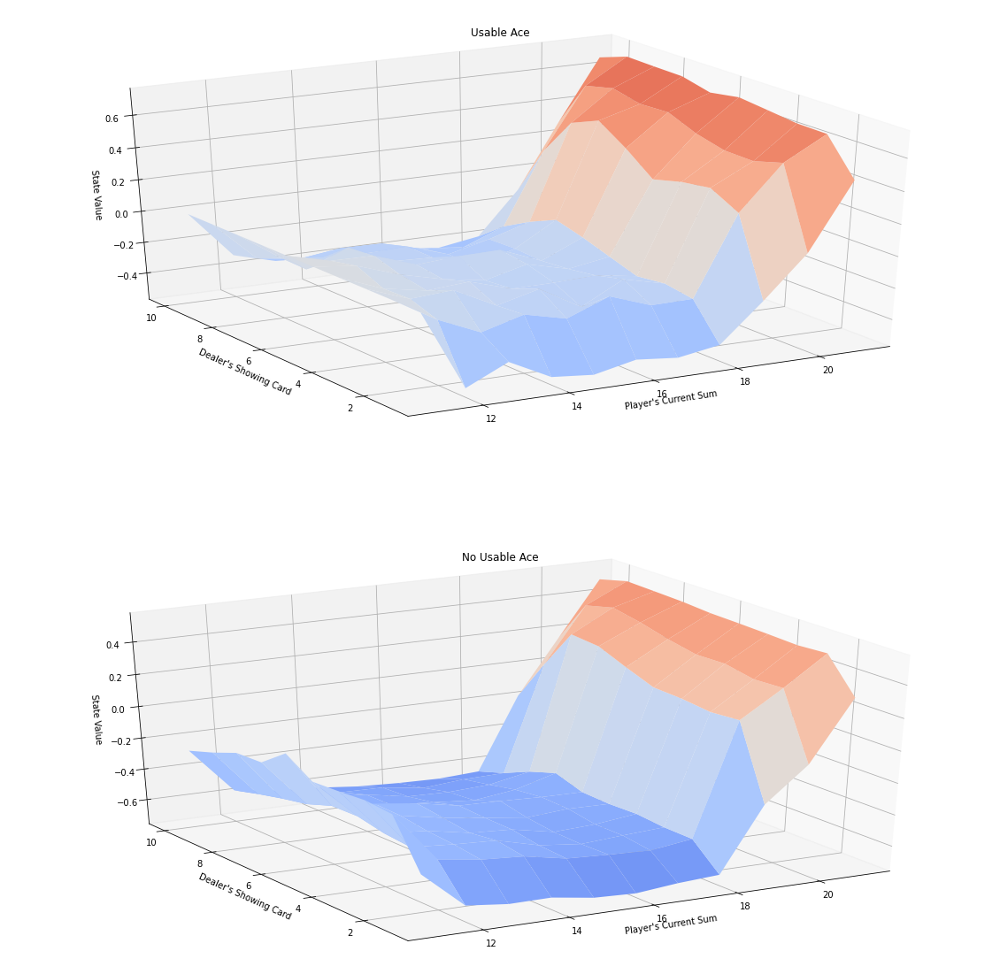

In [12]:
# obtain the action-value function
Q = mc_prediction_q(env, 500000, generate_episode_from_limit_stochastic)

# obtain the corresponding state-value function
V_to_plot = dict((k,(k[0]>18)*(np.dot([0.8, 0.2],v)) + (k[0]<=18)*(np.dot([0.2, 0.8],v))) \
         for k, v in Q.items())

# plot the state-value function
plot_blackjack_values(V_to_plot)

### Part 2: MC Control

In this section, you will write your own implementation of constant-$\alpha$ MC control.  

Your algorithm has four arguments:
- `env`: This is an instance of an OpenAI Gym environment.
- `num_episodes`: This is the number of episodes that are generated through agent-environment interaction.
- `alpha`: This is the step-size parameter for the update step.
- `gamma`: This is the discount rate.  It must be a value between 0 and 1, inclusive (default value: `1`).

The algorithm returns as output:
- `Q`: This is a dictionary (of one-dimensional arrays) where `Q[s][a]` is the estimated action value corresponding to state `s` and action `a`.
- `policy`: This is a dictionary where `policy[s]` returns the action that the agent chooses after observing state `s`.

(_Feel free to define additional functions to help you to organize your code._)

In [ ]:
def mc_control(env, num_episodes, alpha, gamma=1.0):
    nA = env.action_space.n
    # initialize empty dictionary of arrays
    Q = defaultdict(lambda: np.zeros(nA))
    # loop over episodes
    for i_episode in range(1, num_episodes+1):
        # monitor progress
        if i_episode % 1000 == 0:
            print("\rEpisode {}/{}.".format(i_episode, num_episodes), end="")
            sys.stdout.flush()
        
        ## TODO: complete the function
        
    return policy, Q

Use the cell below to obtain the estimated optimal policy and action-value function.  Note that you should fill in your own values for the `num_episodes` and `alpha` parameters.

In [ ]:
# obtain the estimated optimal policy and action-value function
policy, Q = mc_control(env, ?, ?)

Next, we plot the corresponding state-value function.

In [ ]:
# obtain the corresponding state-value function
V = dict((k,np.max(v)) for k, v in Q.items())

# plot the state-value function
plot_blackjack_values(V)

Finally, we visualize the policy that is estimated to be optimal.

In [ ]:
# plot the policy
plot_policy(policy)

The **true** optimal policy $\pi_*$ can be found in Figure 5.2 of the [textbook](http://go.udacity.com/rl-textbook) (and appears below).  Compare your final estimate to the optimal policy - how close are you able to get?  If you are not happy with the performance of your algorithm, take the time to tweak the decay rate of $\epsilon$, change the value of $\alpha$, and/or run the algorithm for more episodes to attain better results.

![True Optimal Policy](images/optimal.png)